In [7]:
# Enable autoreload of imported modules

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
import pandas as pd
from pathlib import Path
import yaml
import spacy

def load_config(path):
    """
    Load event config file and data.

    Returns: Config `cfg` and DataFrame `df`.
    """
    config_file = path
    cfg = yaml.safe_load(Path(config_file).read_text(encoding='utf-8')).get('event', {})

    # Normalize keywords
    nlp = spacy.load("en_core_web_lg")
    doc = nlp(" ".join(cfg["keywords"]))
    cfg['keywords'] = [t.lemma_ for t in doc]

    # Check if cleaned file exists
    cleaned_path = Path(cfg['input_file'].replace('/raw/', '/clean/'))
    if cleaned_path.exists():
        print(f"Reading cleaned file: {cleaned_path}")
        cfg['cleaned_file'] = cleaned_path
        df = pd.read_csv(cleaned_path)
    else: 
        print(f"Reading raw file: {cfg['input_file']}")
        df = pd.read_csv(cfg['input_file'])

    return cfg, df

In [17]:
### Timing decorator
import time

def timing(func):
    def wrapper(*args, **kwargs):
        start = time.perf_counter()
        result = func(*args, **kwargs)
        end = time.perf_counter()
        print(f"{func.__name__} took {end - start:.4f} seconds")
        return result
    return wrapper


In [18]:
from preprocessing.normalize_text import normalize_text_series

def normalize_texts(df, batch_size=50, n_process=10):
    """
    Create clean text columns for 'title', 'text' and 'first_para'.
    """

    if 'title' in df:
        df['title_clean'] = normalize_text_series(df['title'], 
                                                  batch_size=batch_size, 
                                                  n_process=n_process)
    if 'text' in df:
        df['text_clean'] = normalize_text_series(df['text'], 
                                                  batch_size=batch_size, 
                                                  n_process=n_process)
    if 'first_para' in df:
        df['first_para_clean'] = normalize_text_series(df['first_para'], 
                                                  batch_size=batch_size, 
                                                  n_process=n_process)
    
    return df

In [19]:
from preprocessing.tfidf_dedupe import dedupe_tfidf_cosine

@timing
def dedupe_texts(df, text_col):
    """
    Dedupe entries in `df` with nearly identical values in `text_col`. Keeps the longest text by default.
    """
    threshold = 0.9
    min_df = 1  # min doc frequency
    ngram_min = 1
    ngram_max = 2
    max_features=None
    prefer_longer = True
    block_by_length = True  # compare only to similar length documents
    return_groups = True

    deduped_df, report = dedupe_tfidf_cosine(
        df,
        text_col=text_col,
        threshold=threshold,
        min_df=min_df,
        ngram_min=ngram_min,
        ngram_max=ngram_max,
        max_features=max_features,
        prefer_longer=prefer_longer,
        block_by_length=block_by_length,
        return_groups=return_groups,
    )

    return deduped_df, report

In [99]:
config_file = "config/coupdc.yaml"
cfg, df = load_config(config_file)

Reading cleaned file: data/event_data/clean/2022_coup_DC.csv


In [100]:
cfg

{'name': '2022_coup_DC',
 'state': 'DC',
 'input_file': 'data/event_data/raw/2022_coup_DC.csv',
 'start_date': datetime.date(2021, 12, 31),
 'end_date': datetime.date(2022, 2, 6),
 'keywords': ['insurrection',
  'coup',
  'capitol',
  'protest',
  'riot',
  'democracy',
  'government',
  'dc',
  'extremism',
  'violence'],
 'cleaned_file': PosixPath('data/event_data/clean/2022_coup_DC.csv')}

In [96]:

# If we did not find a cleaned file, cleanup text
if not 'cleaned_file' in cfg:
    # Normalize text columns
    df = normalize_texts(df)
    # Dedupe DF
    df, report_text = dedupe_texts(df, text_col='text_clean')
    df, report_title = dedupe_texts(df, text_col='title_clean')
    df, report_para = dedupe_texts(df, text_col='first_para')

    print(f"Documents after deduping: {len(df)}")

In [97]:
# Make datetime indices and filter dates
df.index = pd.DatetimeIndex(pd.to_datetime(df["date"], format="%Y%m%d"))
df = df.sort_index()
df = df[cfg['start_date']: cfg['end_date']]

# Drop datetime indices
df = df.reset_index(drop=True)
df["date"] = pd.to_datetime(df["date"], format="%Y%m%d")
df = df.sort_values("date")
dates = df["date"]


In [98]:
# Normalize time (t=-7 to t=+30), aggregate per day
from typing import Tuple
from datetime import datetime

def normalize_time(df: pd.DataFrame,
                   date_col: str = 'date',
                   onset_date: datetime = None):
    """
    Normalize date column and convert it to discrete time indices.
    """
    if onset_date is None:
        print(f"Must inform onset_date!")
        exit(1)
    onset_date = pd.to_datetime(onset_date)
    
    norm_time = (df[date_col] - onset_date).dt.days
    return norm_time

df['norm_date'] = normalize_time(df, 'date', cfg['onset_date'])
df['norm_date']

KeyError: 'onset_date'

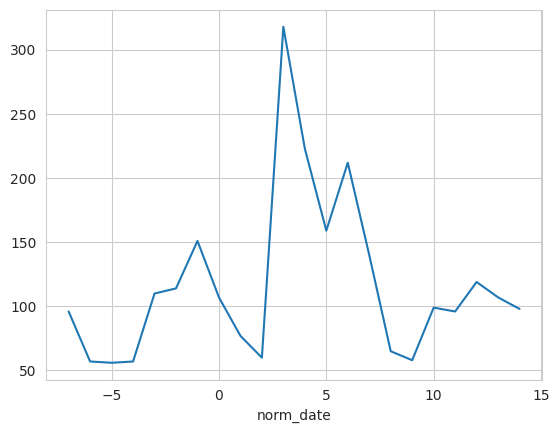

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")
# articles_per_day = df.resample('1D', on="date")['GlobalEventID'].count().plot();
articles_per_day = df.groupby('norm_date')['GlobalEventID'].count().plot();

In [87]:
texts = (df['title_clean'].fillna("") + ". " + df['first_para_clean'].fillna(""))  # .tolist()
# texts = (df['title_clean'].fillna(""))  # .tolist()



In [88]:
df

,GlobalEventID,date,Year,Actor1Code,Actor1Name,Actor1CountryCode,Actor1EthnicCode,Actor2Code,Actor2Name,Actor2CountryCode,...,target,title,text,description,datetime,first_para,title_clean,text_clean,first_para_clean,norm_date
0,1245539343,2025-05-23,2025,USA,UNITED STATES,USA,NaN,NaN,NaN,NaN,...,northdenvernews,"Colorado Republicans Support Trump’s ‘Big, Bea...",Colorado is preparing to implement the country...,"Colorado Republicans back Trump’s ‘Big, Beauti...",2025-05-20T17:08:21+00:00,Colorado is preparing to implement the country...,colorado republicans support trump big beautif...,colorado prepare implement country law regulat...,colorado prepare implement country law regulat...,-7
69,1245582316,2025-05-23,2025,GOV,KING,NaN,NaN,USA,UNITED STATES,USA,...,christianpost,A psychedelic trip that offers to bring you cl...,Will a psychedelic trip bring you closer to Go...,If the Church legitimizes psilocybin as a path...,2025-05-23T00:04:00-04:00,Will a psychedelic trip bring you closer to God?,psychedelic trip offer bring close god,psychedelic trip bring close god question rais...,psychedelic trip bring close god,-7
68,1245689544,2025-05-23,2025,NaN,NaN,NaN,NaN,CAN,TORONTO,CAN,...,yardbarker,Insider Believes Maple Leafs Will Take Run at ...,"It should, truthfully, it should make a ton of...",On the latest episode of 32 Thoughts the Podca...,2025-05-23T11:05:17-04:00,"It should, truthfully, it should make a ton of...",insider believe maple leafs run brad marchand ...,truthfully ton sense lose aside good player ca...,truthfully ton sense lose aside good player ca...,-7
67,1245720976,2025-05-23,2025,JUD,COUNSEL,NaN,NaN,CVL,SETTLEMENT,NaN,...,jdsupra,May 2025 Insurance Update,We touch upon several issues in this month’s u...,We touch upon several issues in this month’s u...,"May 23, 2025",We touch upon several issues in this month’s u...,insurance update,touch issue month update negligent breach cont...,touch issue month update,-7
66,1245720965,2025-05-23,2025,JUD,ATTORNEY,NaN,NaN,NaN,NaN,NaN,...,mortgagenewsdaily,"Servicing With AI, Borrower Portal, 2nd Lien P...",“I can’t afford an Ancestry DNA kit to learn a...,“I can’t afford an Ancestry DNA kit to learn a...,2025-05-23T11:47:50Z,“I can’t afford an Ancestry DNA kit to learn a...,service ai borrower portal lien product bill p...,afford ancestry dna kit learn relative instead...,afford ancestry dna kit learn relative instead...,-7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2508,1249583795,2025-06-13,2025,ISR,ISRAEL,ISR,NaN,NaN,NaN,NaN,...,yahoo,"Maddow Blog | Friday's Mini-Report, 6.13.25",* In Iran: “Israel’s attack on Iran’s Natanz N...,Today’s edition of quick hits.* In Iran: “Isra...,2025-06-13T21:30:10.000Z,* In Iran: “Israel’s attack on Iran’s Natanz N...,maddow blog friday mini report,iran israel attack iran natanz nuclear facilit...,iran israel attack iran natanz nuclear facilit...,14
2507,1249582532,2025-06-13,2025,USAAGR,UNITED STATES,USA,NaN,USA,UNITED STATES,USA,...,durangoherald,New litter of wolf pups spotted by Colorado wi...,Confirmation comes after Pitkin County rancher...,At least one more litter of wolf pups has been...,NaN,Confirmation comes after Pitkin County rancher...,new litter wolf pup spot colorado wildlife off...,confirmation come pitkin county rancher say ca...,confirmation come pitkin county rancher say ca...,14
2506,1249590762,2025-06-13,2025,USA,COLORADO,USA,NaN,NaN,NaN,NaN,...,winnipegfreepress,Men hit by lightning plucked from mountain in ...,"Hey there, time traveller!\n\n This article wa...",Rescuers fetched two men struck by lightning f...,2025-06-13T17:48:37-05:00,This article was published 13/06/2025 (197 day...,man hit lightning pluck mountain record high c...,hey time traveller article publish day ago inf...,article publish day ago information long current,14
2504,1249580574,2025-06-13,2025,USAGOV,COLORADO,USA,NaN,NaN,NaN,NaN,...,cpr,Colorado election officials react to federal r...,An expansive

In [89]:
### Count documents containing seed keywords

import re
from collections import Counter

# Get seed word list from config and normalize to match cleaned texts
seed_words_raw = cfg.get('keywords', [])
# Normalize: lowercase, strip non-alpha (same style as clean_text_regex)
seed_words = []
for w in seed_words_raw:
    w_norm = re.sub(r'[^a-z\s]', '', str(w).lower()).strip()
    if w_norm:
        seed_words.append(w_norm)

seed_words = sorted(set(seed_words))

# 3) Tokenize each cleaned text into a list of words (whitespace split)
def tokenize_cleaned(s: str):
    # 'texts' are already cleaned (lowercase, non-alpha removed, stopwords removed)
    return s.split()

seed_set = set(seed_words)

doc_seed_hits_detail = []
doc_seed_hits_count = []
doc_seed_hits_unique = []

for s in texts:
    toks = tokenize_cleaned(s)
    # Count only tokens that are seeds
    hits = [t for t in toks if t in seed_set]
    cnt = Counter(hits)
    doc_seed_hits_detail.append(cnt)              # Counter dict per doc
    doc_seed_hits_count.append(sum(cnt.values())) # total matches
    doc_seed_hits_unique.append(len(cnt.keys()))  # unique seeds matched

# Attach to df (aligned by row)
df["seed_hits_count"] = doc_seed_hits_count
df["seed_hits_unique"] = doc_seed_hits_unique
# To store a JSON-friendly form of the dict:
df["seed_hits_detail"] = [dict(c) for c in doc_seed_hits_detail]

print(f"Documents with >= 1 seed hit: {(df['seed_hits_count']>0).sum()}/{len(df)}")

Documents with >= 1 seed hit: 697/2579


In [90]:
## Filter only documents with some seed hit

filter_with_seed = True
if filter_with_seed:
    seed_mask = df['seed_hits_count'] >= 2
    df = df[seed_mask].copy().reset_index(drop=True)
    texts = texts[seed_mask].copy().reset_index(drop=True)
    dates = dates[seed_mask].copy().reset_index(drop=True)

print(f"Number of documents after filtering: {len(df)}")

Number of documents after filtering: 460


In [67]:
texts

0      abohar native sunil yadav shoot dead californi...
1      southern california police department give gif...
2      man accuse kill year old son significant menta...
3      asheville police near end helene recovery pers...
4      police shoot victim pete hodge idolize cop law...
                             ...                        
505    miss salinas nurse abandon vehicle locate mile...
506    man officer shoot kill orange county pier alle...
507    attack police jb pritzker flames trump hurt la...
508    soldier kill fort stewart vehicle incident nig...
509    senate story trump tariff canada mexico cost t...
Length: 510, dtype: object

In [68]:
from sentence_transformers import SentenceTransformer

# load embeddings
model_name = "sentence-transformers/all-MiniLM-L6-v2"
embedder = SentenceTransformer(model_name)
embeddings = embedder.encode(texts, batch_size=128, show_progress_bar=True)

Batches:   0%|          | 0/4 [00:00<?, ?it/s]

In [69]:
from analysis.topic_modeling import init_bertopic_model

topic_model = init_bertopic_model(cfg['keywords'], seed_multiplier=1.0)
topics, probs = topic_model.fit_transform(texts, embeddings)

topic_info = topic_model.get_topic_info()
display(topic_info.head(15))

df['topic'] = topics

,Topic,Count,Name,Representation,Representative_Docs
0,-1,212,-1_police_attack_court_new,"[police, attack, court, new, california, say, ...",[new year new law california employer. slew ne...
1,0,154,0_shoot_kill_border_patrol,"[shoot, kill, border, patrol, man, border patr...",[woman arrest charge minnesota native border p...
2,1,62,1_fire_los_angeles_los angeles,"[fire, los, angeles, los angeles, home, destro...",[official form task force combat crime relate ...
3,2,82,2_trump_vehicle_russia_say,"[trump, vehicle, russia, say, president, year,...",[russia ukraine sanction update month december...


In [22]:
# # # === Analyze topic coverage of seed hits

# from analysis.topic_modeling import print_topic_coverage_of_seeds

# print_topic_coverage_of_seeds(df, topics, topic_model, cfg['keywords'])


In [70]:
topic_model.visualize_documents(texts, embeddings=embeddings)

In [71]:
### BEGIN MERGING TOPICS
texts

0      abohar native sunil yadav shoot dead californi...
1      southern california police department give gif...
2      man accuse kill year old son significant menta...
3      asheville police near end helene recovery pers...
4      police shoot victim pete hodge idolize cop law...
                             ...                        
505    miss salinas nurse abandon vehicle locate mile...
506    man officer shoot kill orange county pier alle...
507    attack police jb pritzker flames trump hurt la...
508    soldier kill fort stewart vehicle incident nig...
509    senate story trump tariff canada mexico cost t...
Length: 510, dtype: object

In [72]:

d_texts = pd.concat(
    [texts.reset_index(drop=True),
     dates.reset_index(drop=True)],
    axis=1
)

In [73]:
doc_info = topic_model.get_document_info(texts)


In [74]:
d_texts.to_csv("/data/jupyter/vehiclela_d_texts.csv", index=False)

In [75]:
doc_info.to_csv("/data/jupyter/vehiclela_radar_topics.csv", index=False)

In [25]:
# ### MERGE USING SEED HITS


# import numpy as np
# import pandas as pd
# from collections import Counter, defaultdict
# from typing import Dict, List, Tuple
# from sentence_transformers import util

# # -----------------------------
# # 1) Build topic-level seed vectors with IDF weighting
# # -----------------------------
# def compute_topic_seed_vectors(
#     df: pd.DataFrame,
#     seed_words: List[str],
#     topic_col: str = "topic"
# ) -> Tuple[Dict[int, np.ndarray], Dict[int, int], np.ndarray]:
#     """
#     Returns:
#       topic_vecs: dict {topic_id: (len(seed_words),) np.ndarray} weighted by topic-IDF
#       topic_sizes: dict {topic_id: n_docs}
#       idf: (len(seed_words),) np.ndarray of IDF weights across topics
#     """
#     # Map seed index
#     seed_index = {w: i for i, w in enumerate(seed_words)}
#     # Collect topics (exclude -1 unless you want to merge outliers too)
#     topic_ids = sorted(t for t in set(df[topic_col]) if t != -1)

#     # Per-topic raw seed counts
#     raw_counts = {t: np.zeros(len(seed_words), dtype=np.float32) for t in topic_ids}
#     topic_sizes = {t: int((df[topic_col] == t).sum()) for t in topic_ids}

#     # Count occurrences per topic
#     for t in topic_ids:
#         g = df[df[topic_col] == t]["seed_hits_detail"]
#         # g consists of dicts {seed: freq} per doc
#         agg = Counter()
#         for d in g:
#             if isinstance(d, dict) and d:
#                 agg.update(d)
#         vec = raw_counts[t]
#         for w, c in agg.items():
#             if w in seed_index:
#                 vec[seed_index[w]] += float(c)

#     # Topic presence per seed (for IDF): in how many topics does each seed appear?
#     presence = np.zeros(len(seed_words), dtype=np.int32)
#     for j in range(len(seed_words)):
#         for t in topic_ids:
#             if raw_counts[t][j] > 0:
#                 presence[j] += 1

#     # Smooth IDF (topics-based)
#     # idf_j = log( (T + 1) / (1 + presence_j) ) + 1
#     T = max(1, len(topic_ids))
#     idf = np.log((T + 1) / (1 + presence)) + 1.0

#     # Apply IDF and L2-normalize
#     topic_vecs = {}
#     for t in topic_ids:
#         v = raw_counts[t] * idf
#         # Optional: normalize by topic size to get per-doc influence
#         if topic_sizes[t] > 0:
#             v = v / topic_sizes[t]
#         # L2 normalize to compare with cosine
#         n = np.linalg.norm(v)
#         topic_vecs[t] = v if n == 0 else (v / n)

#     return topic_vecs, topic_sizes, idf


# # -----------------------------
# # 2) (Optional) representative embedding similarity gate
# # -----------------------------
# def topic_rep_embedding(topic_model, embedder, topic_id, k=10):
#     rep_docs = topic_model.get_representative_docs(topic_id)[:k]
#     if len(rep_docs) == 0:
#         return None
#     emb = embedder.encode(rep_docs, batch_size=64, show_progress_bar=False)
#     v = emb.mean(axis=0)
#     # Normalize
#     n = np.linalg.norm(v)
#     return v if n == 0 else (v / n)

# def build_embed_index(topic_model, embedder, topic_ids: List[int]) -> Dict[int, np.ndarray]:
#     idx = {}
#     for t in topic_ids:
#         v = topic_rep_embedding(topic_model, embedder, t)
#         if v is not None:
#             idx[t] = v
#     return idx


# # -----------------------------
# # 3) Build candidate merges by seed similarity (and optional embedding gate)
# # -----------------------------
# def build_seed_merge_pairs(
#     topic_vecs: Dict[int, np.ndarray],
#     topic_sizes: Dict[int, int],
#     seed_sim_threshold: float = 0.60,   # cosine in seed space
#     min_shared_seeds: int = 2,          # require at least 2 non-zero seed dimensions in each topic
#     # Embedding gate
#     embed_index: Dict[int, np.ndarray] = None,
#     require_embedding_sim: bool = True,
#     embed_sim_threshold: float = 0.65,
#     # Size constraints
#     max_merge_ratio: float = 3.0,       # do not merge if larger/smaller ratio too extreme
# ) -> List[Tuple[int, int]]:
#     """
#     Returns pairs (ti, tj) to merge. We do not apply connected-component logic here yet;
#     we just propose edges that pass criteria.
#     """
#     tids = sorted(topic_vecs.keys())
#     pairs = []

#     # Precompute non-zero seed counts per topic
#     nnz = {t: int(np.count_nonzero(topic_vecs[t])) for t in tids}

#     for i, ti in enumerate(tids):
#         for tj in tids[i+1:]:
#             # Basic nnz constraint
#             if nnz[ti] < min_shared_seeds or nnz[tj] < min_shared_seeds:
#                 continue

#             # Seed cosine similarity
#             s = float(np.dot(topic_vecs[ti], topic_vecs[tj]))
#             if s < seed_sim_threshold:
#                 continue

#             # Size ratio constraint
#             a, b = topic_sizes[ti], topic_sizes[tj]
#             if a == 0 or b == 0:
#                 continue
#             r = max(a, b) / max(1, min(a, b))
#             if r > max_merge_ratio:
#                 # Skip extremely imbalanced merges unless both are small (you can relax this if needed)
#                 continue

#             # Optional embedding gate
#             if require_embedding_sim and embed_index is not None and (ti in embed_index) and (tj in embed_index):
#                 e = util.cos_sim(embed_index[ti], embed_index[tj]).item()
#                 if e < embed_sim_threshold:
#                     continue

#             pairs.append((ti, tj))

#     return pairs


# # -----------------------------
# # 4) Merge by connected components (merge all topics in each component into the largest)
# # -----------------------------
# def connected_components_from_pairs(pairs: List[Tuple[int, int]]) -> List[List[int]]:
#     # Build adjacency
#     adj = defaultdict(set)
#     for a, b in pairs:
#         adj[a].add(b)
#         adj[b].add(a)
#     # Gather nodes
#     nodes = set()
#     for a, b in pairs:
#         nodes.add(a); nodes.add(b)
#     # DFS
#     comps = []
#     visited = set()
#     for s in nodes:
#         if s in visited:
#             continue
#         stack = [s]
#         comp = []
#         visited.add(s)
#         while stack:
#             u = stack.pop()
#             comp.append(u)
#             for v in adj[u]:
#                 if v not in visited:
#                     visited.add(v)
#                     stack.append(v)
#         comps.append(sorted(comp))
#     return comps


# def merge_topics_using_seed_hits(
#     df: pd.DataFrame,
#     seed_words: List[str],
#     topic_model,
#     texts: List[str],
#     embeddings: np.ndarray,
#     embedder=None,
#     rounds: int = 2,
#     seed_sim_threshold: float = 0.60,
#     embed_sim_threshold: float = 0.75,
#     min_shared_seeds: int = 3,
#     max_merge_ratio: float = 3.0,
#     require_embedding_sim: bool = True,
#     verbose: bool = True,
# ) -> pd.DataFrame:
#     """
#     Runs up to `rounds` of seed-based merging. After each round, transforms to update assignments.
#     Returns updated topic_info DataFrame.
#     """
#     for r in range(rounds):
#         # Recompute vectors on current assignments
#         topic_vecs, topic_sizes, idf = compute_topic_seed_vectors(df, seed_words, topic_col="topic")
#         topic_ids = sorted(topic_vecs.keys())

#         # Optional: embedding gate
#         embed_index = None
#         if require_embedding_sim and (embedder is not None) and len(topic_ids) > 0:
#             embed_index = build_embed_index(topic_model, embedder, topic_ids)

#         # Build candidate edges
#         edges = build_seed_merge_pairs(
#             topic_vecs=topic_vecs,
#             topic_sizes=topic_sizes,
#             seed_sim_threshold=seed_sim_threshold,
#             min_shared_seeds=min_shared_seeds,
#             embed_index=embed_index,
#             require_embedding_sim=require_embedding_sim,
#             embed_sim_threshold=embed_sim_threshold,
#             max_merge_ratio=max_merge_ratio,
#         )

#         if verbose:
#             print(f"[Round {r+1}] Candidate edges (seed-based): {len(edges)}")

#         if not edges:
#             break

#         # Connected components over edges
#         comps = connected_components_from_pairs(edges)
#         if verbose:
#             print(f"[Round {r+1}] Components to merge: {len(comps)}")

#         # For each component, merge all topics into the largest one
#         pairs_to_merge = []
#         for comp in comps:
#             if len(comp) < 2:
#                 continue
#             # Representative = largest by n_docs
#             rep = max(comp, key=lambda t: topic_sizes.get(t, 0))
#             for t in comp:
#                 if t != rep:
#                     pairs_to_merge.append((rep, t))

#         if verbose:
#             print(f"[Round {r+1}] Calling BERTopic.merge_topics with {len(pairs_to_merge)} pairs...")
#             print(pairs_to_merge[:10])

#         if len(pairs_to_merge) == 0:
#             break

#         # Merge in BERTopic
#         topic_model.merge_topics(texts, topics_to_merge=pairs_to_merge)

#         # Update assignments after merge
#         new_topics, new_probs = topic_model.transform(texts, embeddings)
#         df["topic"] = new_topics

#     # Return final topic info
#     topic_info = topic_model.get_topic_info()
#     if verbose:
#         print(topic_info.head(15))
#     return topic_info


In [26]:
# # ==== Merge topics
# from analysis.safe_merge_topics import merge_topics_using_seed_hits

# new_topics = merge_topics_using_seed_hits(
#     df, seed_words, topic_model, texts, embeddings,
#     seed_sim_threshold=0.7, embed_sim_threshold=0.7
# )


In [27]:
# Calculate overlap in topic words
from sklearn.metrics import pairwise_distances

def topic_top_terms(topic_id, n=10):
    terms = topic_model.get_topic(topic_id)  # list of (term, score)
    return [t[0] for t in terms[:n]]

def jaccard_similarity(a, b):
    sa, sb = set(a), set(b)
    return len(sa & sb) / max(1, len(sa | sb))

def jaccard_distance(a, b):
    ta, tb = topic_top_terms(a), topic_top_terms(b)
    return 1 - jaccard_similarity(ta, tb)

# Get all topics
info = topic_model.get_topic_info()
valid_topics = [t for t in info["Topic"] if t != -1]

d = pairwise_distances(valid_topics, metric=jaccard_distance)
jaccard_sims = 1 - d




In [28]:
# Reassign outliers
from analysis.topic_modeling import reassign_outliers

reassign_outliers(df, probs, reassign_prob=0.25)


Outliers before reassign: 695
Outliers after reassign: 485


In [29]:

topic_info = topic_model.get_topic_info()
display(topic_info.head(20))


,Topic,Count,Name,Representation,Representative_Docs
0,-1,695,-1_mass_gun_mass shooting_shooting,"[mass, gun, mass shooting, shooting, paso, tex...",[texas governor face backlash anti immigrant e...
1,0,531,0_shoot_paso_texas_gunman,"[shoot, paso, texas, gunman, kill, police, wal...",[el paso shooting suspect book capital murder ...
2,1,357,1_trump_president_donald_donald trump,"[trump, president, donald, donald trump, presi...",[fox news push white supremacist great replace...
3,2,166,2_odessa_sept_abbott_greg,"[odessa, sept, abbott, greg, law, texas, say, ...",[trump slam pressure mount gun control. pressu...
4,3,160,3_gun_check_background check_background,"[gun, check, background check, background, mcc...",[hillary clinton call mcconnell gop help democ...
5,4,114,4_walmart_sell_store_ammunition,"[walmart, sell, store, ammunition, sale, arres...",[texas police arrest man imminent threat local...
6,5,110,5_dayton_ohio_dayton ohio_hour,"[dayton, ohio, dayton ohio, hour, mass shootin...",[ohio shoot gunman kill include sister outside...
7,6,34,6_mexico_mexican_drug_border,"[mexico, mexican, drug, border, patrol, valdez...",[el paso shooting mexico explore legal action ...


In [30]:
# Temporal dynamics

topics_over_time = topic_model.topics_over_time(texts, dates, nr_bins=35)  # ~5 weeks
fig = topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=5)
fig

In [31]:

# # Show topic hierarchy after merge

# hier_topics = topic_model.hierarchical_topics(texts)
# fig_h = topic_model.visualize_hierarchy(hierarchical_topics=hier_topics)
# fig_h  


In [32]:
topic_model.visualize_documents(texts, topics=df['topic'], embeddings=embeddings)

In [33]:
def get_largest_topic_id(topic_info: pd.DataFrame) -> Tuple[int, int]:
    """
    Returns the ID of the topic with the most documents.

    Args:
        topic_info (pd.DataFrame) :

    Returns:
        topic_id (int) : The largest topic id.
    """
    largest_topic_row = topic_info.loc[topic_info['Count'].idxmax()]
    largest_topic_id = largest_topic_row['Topic']
    largest_topic_size = largest_topic_row['Count']

    return largest_topic_id, largest_topic_size


def get_topic_and_complement_dfs(df: pd.DataFrame, topic_id: int, topic_col: str = 'topic') -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Returns two pandas DataFrames `df_topic` and `df_c`, where:
        - `df_topic` holds the subset of documents that belong to topic `topic_id`.
        - `df_c` holds the complement of documents that belong in the complement of `topic_id` (i.e.: all topics not `topic_id`).

    Args:
        df (pd.DataFrame) : The DataFrame containing a column named 'topic'
        topic_id (int) : The topic id to choose.
        topic_col (str) : The name of the topic column (default: 'topic').

    Returns:
        df_topic (pd.DataFrame)
        df_c (pd.DataFrame)
        mask (np.ndarray[bool]) : The boolean mask of topic row ids

    """
    df["row_id"] = np.arange(len(df)) 

    # Normalize 'date' to pandas datetime for display
    if pd.api.types.is_integer_dtype(df["date"]) or pd.api.types.is_string_dtype(df["date"]):
        df["dt"] = pd.to_datetime(df["date"].astype(str), format="%Y%m%d", errors="coerce")
    else:
        # If df already has a datetime column, use it
        df["dt"] = pd.to_datetime(df["date"], errors="coerce")

    mask = (df[topic_col] == topic_id)
    df_topic = df[mask].copy()
    df_c = df[(~mask)&(df['topic']!=-1)].copy()

    return df_topic, df_c, mask
    


In [34]:
# Centroid functions
from numpy.linalg import norm
import numpy as np


def cosine_distance(a: np.ndarray, b: np.ndarray) -> float:
    na, nb = norm(a), norm(b)
    if na == 0 or nb == 0:
        return np.nan
    return 1.0 - float(np.dot(a, b) / (na * nb))



def geometric_median(X, eps=1e-5, max_iter=200):
    # X: (n, d)
    y = X.mean(axis=0)
    for _ in range(max_iter):
        d = np.linalg.norm(X - y, axis=1)
        # Avoid division by zero
        d = np.where(d < eps, eps, d)
        w = 1.0 / d
        y_new = (w[:, None] * X).sum(axis=0) / w.sum()
        if np.linalg.norm(y_new - y) < eps:
            break
        y = y_new
    return y


def compute_daily_centroids(df, embeddings, centroid_method: str = "mean") -> pd.DataFrame:
    """
    Compute the centroids for each day for a given topic dataframe.

    Args:
        df (pd.DataFrame): input topic dataframe.
        embeddings (np.ndarray[float]) : The document embeddings.
        centroid_method (str) : The centroid calculation method {'mean' or 'median'}.
    Returns:
    """
    ## Compute the centroids for each day

    daily_centroids = []
    groups = df.groupby(df["date"])
    for gdate, gdf in groups:
        pos_idx = gdf["row_id"].to_numpy()  # Get row positions in original df
        # Find local positions for embeddings
        local_idx = df.index.get_indexer(gdf.index)        # positions within df_topic    
        emb_day = embeddings[local_idx]  # Get embeddings for this date
        if emb_day.size == 0:
            continue
        if centroid_method == "mean":
            centroid_sbert = emb_day.mean(axis=0)  # Compute centroid
        elif centroid_method == "median":
            centroid_sbert = geometric_median(emb_day)
        else:
            print(f"Invalid centroid_method: {centroid_method}")
            exit(1)
        daily_centroids.append({
            "date_str": gdate,
            "emb": centroid_sbert,
            "n_docs": len(emb_day)
        })


    # Convert to DataFrame and sort chronologically
    cent_df = pd.DataFrame(daily_centroids)
    # Normalize date: if 'date' is an int/string in YYYYMMDD format, convert to datetime
    cent_df["dt"] = cent_df['date_str']
    cent_df = cent_df.sort_values("dt").reset_index(drop=True)

    return cent_df


def smoothen_centroids(cent_df: pd.DataFrame) -> pd.DataFrame:
    #  Exponential Moving Average (EMA) smoothing of centroids (vector EMA)
    use_vol_scale = True

    vol_scale = np.percentile(cent_df["n_docs"], 75)  # robust target volume
    base_alpha = 0.20  # Lower = smoother

    ema = []
    prev = None
    for i, row in cent_df.iterrows():
        c = row["emb"]  # numpy 1D vector
        n = row["n_docs"]
        # Adjust alpha per number of documents on that day / cap at [min_alpha, base_alpha]
        if use_vol_scale:
            adj_alpha = base_alpha * min(1.0, n / vol_scale)
            adj_alpha = max(0.05, adj_alpha)  # avoid freezing on small n
        else:
            adj_alpha = base_alpha

        if prev is None:
            s = c.copy()           # initialize EMA with first day's centroid
        else:
            s = adj_alpha * c + (1.0 - adj_alpha) * prev
        ema.append(s)
        prev = s

    cent_df["centroid_ema"] = ema  # attach smoothed centroid


    # Distance between consecutive smoothed centroids (main stability signal)
    dist_smooth = [np.nan]
    for i in range(1, len(cent_df)):
        d = cosine_distance(cent_df.loc[i, "centroid_ema"], cent_df.loc[i-1, "centroid_ema"])
        dist_smooth.append(d)
    cent_df["dist_smooth_to_prev_smooth"] = dist_smooth

    # Distance between raw centroid and previous day's smoothed centroid (outlier sensitivity)
    dist_raw_to_prev_smooth = [np.nan]
    for i in range(1, len(cent_df)):
        d = cosine_distance(cent_df.loc[i, "emb"], cent_df.loc[i-1, "centroid_ema"])
        dist_raw_to_prev_smooth.append(d)
    cent_df["dist_raw_to_prev_smooth"] = dist_raw_to_prev_smooth

    return cent_df

In [35]:
# Find largest topic

topic_info = topic_model.get_topic_info()

# Find the largest topic by size
largest_topic_row = topic_info.loc[topic_info['Count'].idxmax()]
largest_topic_id = largest_topic_row['Topic']
largest_topic_size = largest_topic_row['Count']

print(f"Largest topic ID: {largest_topic_id}, Size: {largest_topic_size}")
print("Top words:", topic_model.get_topic(largest_topic_id))



Largest topic ID: -1, Size: 695
Top words: [('mass', np.float64(0.2998856403006099)), ('gun', np.float64(0.29367895135711924)), ('mass shooting', np.float64(0.2881926715072358)), ('shooting', np.float64(0.2854319146103874)), ('paso', np.float64(0.2688456109121148)), ('texas', np.float64(0.268263205017564)), ('violence', np.float64(0.2617386437207107)), ('people', np.float64(0.249145658798626)), ('law', np.float64(0.2404900782652024)), ('white', np.float64(0.2385039578296637))]


          dt  n_docs  dist_smooth_to_prev_smooth  dist_raw_to_prev_smooth
0 2019-07-26       2                         NaN                      NaN
1 2019-07-27       1                    0.001536                 0.538992
2 2019-07-28       1                    0.001611                 0.545492
3 2019-07-29       2                    0.001219                 0.647353
4 2019-07-30       2                    0.000874                 0.358270
5 2019-07-31       5                    0.003871                 0.759979
6 2019-08-01       4                    0.001257                 0.420014
7 2019-08-02       2                    0.002261                 0.696811
8 2019-08-03       7                    0.006189                 0.353705
9 2019-08-04      45                    0.010815                 0.265015
          dt  n_docs  dist_smooth_to_prev_smooth  dist_raw_to_prev_smooth
0 2019-07-26       5                         NaN                      NaN
1 2019-07-27       1                  

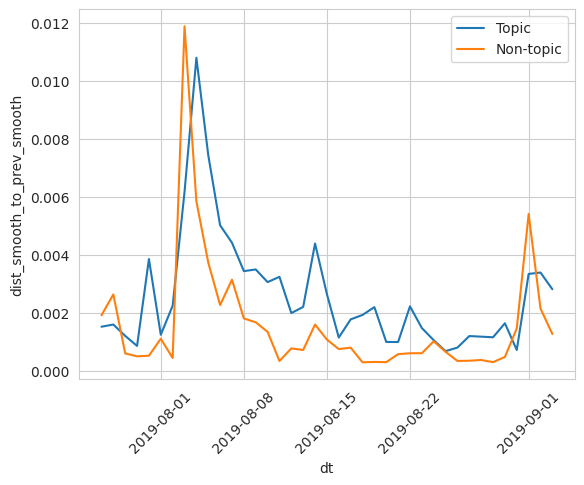

In [36]:
# Retrieve subsets of DataFrame and embeddings
import matplotlib.pyplot as plt


df_topic, df_c, mask = get_topic_and_complement_dfs(df, largest_topic_id)

embeddings_topic = embeddings[mask]
embeddings_c = embeddings[~mask]
texts_topic = texts[mask]

# ## Compute the centroids for each day
cent_df = compute_daily_centroids(df_topic, embeddings_topic)
cent_df = smoothen_centroids(cent_df)


## Compute non-topic centroids
cent_df_c = compute_daily_centroids(df_c, embeddings_c)
cent_df_c = smoothen_centroids(cent_df_c)


print(cent_df[["dt", "n_docs", "dist_smooth_to_prev_smooth", "dist_raw_to_prev_smooth"]].head(10))

print(cent_df_c[["dt", "n_docs", "dist_smooth_to_prev_smooth", "dist_raw_to_prev_smooth"]].head(10))


sns.lineplot(data=cent_df, x='dt', y='dist_smooth_to_prev_smooth', label='Topic');
plt.xticks(rotation=45);


sns.lineplot(data=cent_df_c, x='dt', y='dist_smooth_to_prev_smooth', label='Non-topic')
plt.xticks(rotation=45);




In [45]:
import umap

In [39]:

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

import textwrap

def plot_centroid_interactive(df_topic, embeddings_topic, 
                              plot_title: str= "Topic",
                              save_to_file: bool = False, 
                              filename: str = "topic_centroids.html"):

    reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, metric="cosine", random_state=13)
    topic_2d = reducer.fit_transform(embeddings_topic)

    assert topic_2d.shape[0] == len(df_topic), "UMAP output must match topic subset size"

    plot_df = df_topic.reset_index(drop=True).copy()
    plot_df["umap_x"] = topic_2d[:, 0]
    plot_df["umap_y"] = topic_2d[:, 1]

    # Shorten text for hover
    def short_text(s, width=60):
        if not isinstance(s, str):
            return ""
        s = " ".join(s.split())  # normalize whitespace
        return textwrap.shorten(s, width=width, placeholder="…")
        # return textwrap.wrap(s, width=width, max_lines=2, placeholder="...")

    plot_df["hover_text"] = plot_df["text"].apply(lambda s: short_text(s, width=180))
    plot_df["hover_title"] = plot_df["title"].apply(lambda s: short_text(s, width=120))
    plot_df["date_str"] = plot_df["dt"].dt.strftime("%Y-%m-%d")  # nice format for the animation slider

    # You can color by source domain, outlet, or nothing; here we color by domain if present.
    color_col = "domain" if "domain" in plot_df.columns else None

    centroids_2d_smooth = reducer.transform(np.array(cent_df['centroid_ema'].values.tolist()))
    cent_df['centroid_x_sm'] = centroids_2d_smooth[:, 0].tolist()
    cent_df['centroid_y_sm'] = centroids_2d_smooth[:, 1].tolist()
    # Also plot raw centroid
    centroids_2d= reducer.transform(np.array(cent_df['emb'].values.tolist()))
    cent_df['centroid_x'] = centroids_2d[:, 0].tolist()
    cent_df['centroid_y'] = centroids_2d[:, 1].tolist()

    plot_df = plot_df.groupby("date").sample(n=300, replace=True)
    ordered_dates = sorted(list(plot_df["date_str"].unique()))

    fig = px.scatter(
        plot_df,
        x="umap_x",
        y="umap_y",
        category_orders={"date_str": ordered_dates},
        color=None,                      # set to None to hide
        hover_name="hover_title",
        hover_data={
            "umap_x": False, "umap_y": False, # hide numeric coords in hover
            "date_str": True,
            "SOURCEURL": True,
            "hover_text": True,
        },
        animation_frame="date_str",           # one plot per day via slider
        title=f"{plot_title} — UMAP by Day (hover for title/text/URL)",
        template="plotly_white",
    )

    ## Make the hover prettier: fully control which fields show
    fig.update_traces(
        hovertemplate="<b>%{hovertext}</b><br>" +  # uses hover_name
                    "Date: %{customdata[0]}<br>" +
                    "<extra></extra>"
    )

    # Or use a more explicit hovertemplate with multiple fields (override above):
    # Note: when using 'hover_data' dict, Plotly packs them in order; alternatively, build a custom column.
    # Here's a robust custom hover using "text" + "customdata" for full control:
    custom_hover = (
        "Title: %{customdata[0]}<br>" +
        "Date: %{customdata[1]}<br>" +
        "URL: %{customdata[2]}<br><br>" +
        "%{customdata[3]}"
    )

    fig.update_traces(
        text=plot_df["hover_title"],  # fallback
        customdata=np.stack([
            plot_df["hover_title"],
            plot_df["date_str"],
            plot_df["SOURCEURL"].fillna(""),
            plot_df["hover_text"]
        ], axis=1),
        hovertemplate=custom_hover
    )


    # --- Add centroid markers to each frame ---
    # Build centroid-only frames and merge into the existing frames by name
    centroid_frames = []
    for d in ordered_dates:
        cdf = cent_df[cent_df["date_str"] == d]
        centroid_frames.append(go.Frame(
            name=d,
            data=[go.Scatter(
                x=cdf["centroid_x"],
                y=cdf["centroid_y"],
                mode="markers",
                marker=dict(size=12, symbol="x", color="red", line=dict(width=1, color="yellow")),
                name="Centroid (raw)",
                hovertemplate="<b>Raw centroid</b><br>Date: %{x|}<br><extra>n_docs: %{text}</extra>",
                text=cdf["n_docs"]
            ),
            go.Scatter(
                x=cdf["centroid_x_sm"],
                y=cdf["centroid_y_sm"],
                mode="markers",
                marker=dict(size=12, symbol="circle", color="black", line=dict(width=1, color="yellow")),
                name="Centroid (smoothed)",
                hovertemplate="<b>Smoothed centroid</b><br>Date: %{x|}<br><extra>n_docs: %{text}</extra>",
                text=cdf["n_docs"]
            )
            ]
        ))


    # Need to call "add_trace" or marker will not appear!
    if ordered_dates:
        first_date = ordered_dates[0]
        c0 = cent_df[cent_df["date_str"] == first_date]
        if not c0.empty:
            fig.add_trace(go.Scatter(
                x=c0["centroid_x"], y=c0["centroid_y"],
                mode="markers",
                marker=dict(size=12, symbol="x", color="red", line=dict(width=1, color="yellow")),
                name="Raw centroid",
                hovertemplate="<b>Raw centroid</b><br><extra>n_docs: %{text}</extra>",
                text=c0["n_docs"]
            ))
            fig.add_trace(go.Scatter(
                x=c0["centroid_x_sm"], y=c0["centroid_y_sm"],
                mode="markers",
                marker=dict(size=12, symbol="circle", color="black", line=dict(width=1, color="yellow")),
                name="Smoothed centroid",
                hovertemplate="<b>Smoothed centroid</b><br><extra>n_docs: %{text}</extra>",
                text=c0["n_docs"]
            ))


    # Merge centroid frames into px frames
    if fig.frames:
        base_frames = {fr.name: fr for fr in fig.frames}
        for fr in centroid_frames:
            if fr.name in base_frames:
                base_frames[fr.name].data += fr.data
            else:
                fig.frames += (fr,)
    else:
        fig.frames = tuple(centroid_frames)


    # --- Make axes proportional and square (optional but recommended) ---
    xmin, xmax = np.nanmin(plot_df["umap_x"]), np.nanmax(plot_df["umap_x"])
    ymin, ymax = np.nanmin(plot_df["umap_y"]), np.nanmax(plot_df["umap_y"])
    x_center = 0.5 * (xmin + xmax)
    y_center = 0.5 * (ymin + ymax)
    half_span = max(xmax - xmin, ymax - ymin) / 2.0
    pad = 0.05 * half_span
    x_range = [x_center - half_span - pad, x_center + half_span + pad]
    y_range = [y_center - half_span - pad, y_center + half_span + pad]

    fig.update_layout(width=720, height=720)
    fig.update_xaxes(range=x_range, constrain="domain")
    fig.update_yaxes(range=y_range, constrain="domain", scaleanchor="x", scaleratio=1)


    fig.update_layout(
        height=600,
        width=1200,
        xaxis_title="UMAP-1",
        yaxis_title="UMAP-2",
        legend_title_text="Centroid",
        margin=dict(l=40, r=40, t=60, b=40),
        updatemenus=[{
            "type": "buttons",
            "buttons": [
                {"label": "Play", "method": "animate", "args": [None]},
                {"label": "Pause", "method": "animate", "args": [[None], {"frame": {"duration": 0, "redraw": False}, "mode": "immediate"}]}
            ],
        }]
    )
    # Tune frame duration
    fig.layout.sliders[0].currentvalue = {"prefix": "Date: ", "visible": True}
    fig.layout.sliders[0].transition = {"duration": 300}
    # for frame in fig.frames:
    #     fig.layout.sliders[0].transition = {"duration": 300}


    fig.show()

    if save_to_file:
        fig.write_html(f"{filename}", include_plotlyjs="cdn")
        print("Saved interactive HTML:", f"{filename}")


In [46]:
plot_centroid_interactive(df_topic, embeddings_topic, plot_title=cfg['name'])

In [47]:
### === Run another level of topic modeling to extract daily topics

df_topic = df_topic.copy().reset_index(drop=True)
embeddings_topic = embeddings_topic.copy()
texts_topic = texts_topic.copy().reset_index(drop=True)

assert len(df_topic) == len(embeddings_topic) == len(texts_topic)


In [51]:
import hdbscan
from bertopic import BERTopic

umap_model_2 = umap.UMAP(n_neighbors=15, n_components=10, min_dist=0.0, metric="cosine", random_state=3)
# hdbscan_model = HDBSCAN(min_cluster_size=25, metric="cosine",
#                         cluster_selection_epsilon=0.0)
# WARNING: Use scikit-learn's HDBSCAN will not return `probs` in the right way!

# Note: we will use Euclidean distance with HDBSCAN because the HDBSCAN package does not implement cosine
# However, this is fine because the SentenceTransform embeddings are normalized, hence Euclidean is related to Cosine
hdbscan_model_2 = hdbscan.HDBSCAN(min_cluster_size=10, metric="euclidean",
                                min_samples=5,
                                cluster_selection_epsilon=0.0,   # Smaller value produces more (and smaller) clusters.
                                cluster_selection_method="eom",
                                prediction_data=True)

topic_model_2 = BERTopic(umap_model=umap_model_2,
                       hdbscan_model=hdbscan_model_2,
                       calculate_probabilities=True,
                       verbose=False,
                       nr_topics=5)

topics_2, probs_2 = topic_model_2.fit_transform(texts_topic, embeddings_topic)

In [52]:
topic_2_info = topic_model_2.get_topic_info()
display(topic_2_info.head(15))

,Topic,Count,Name,Representation,Representative_Docs
0,0,12,0_staff_half_flag_order,"[staff, half, flag, order, lower, honor, victi...",[flag lower half staff honor victim texas ohio...
1,1,14,1_travel_issue_amnesty_international,"[travel, issue, amnesty, international, countr...",[amnesty international warn travel likely shoo...
2,2,19,2_red_flag_law_gun,"[red, flag, law, gun, support, congress, mass,...",[bipartisan red flag gun law support congress ...
3,3,440,3_shooting_mass_gun_texas,"[shooting, mass, gun, texas, el, paso, people,...",[texas governor face backlash anti immigrant e...


In [53]:
topic_model_2.visualize_documents(texts_topic, topics=topics_2, embeddings=embeddings_topic)